# Regresión

Es regresión porque la variable de salida (productividad esperada) es numérica y continua



## Métricas de Regresión

> Las mejores son MAPE y MSE


### Coeficiente de Determinación

> $$ R^{2} \rightarrow 1 $$

$$ R^{2} = 1 - \frac{\sum{(y_i - \hat{y})^2}}{\sum{(y_i - \bar{y})^2}} $$ 


### Error Cuadrático Medio:

> $$ MSE \rightarrow 0 $$

$$ \text{MSE} = \frac{1}{n} \sum_{i=1}^n (y_i - \hat{y}_i)^2 $$

### Error Medio Absoluto

> $$ MAE \rightarrow 0 $$

$$ \text{MAE} = \frac{1}{n} \sum_{i=1}^n |y_i - \hat{y}_i| $$

### Porcentaje Del Error Medio Absoluto

> $$ MAPE \rightarrow 0\% $$

$$ \text{MAPE} = \frac{1}{n} \sum_{i=1}^n \left| \frac{y_i - \hat{y}_i}{y_i} \right| \times 100\% 





## Modelos para Regresión

### Regresión Lineal

No hay clasificador duro con función sigmoidea

### Máquinas de Soporte Vectorial

### K Vecinos Más Cercanos

Busca minimizar la diferencia entre los individuos más cercanos. 

El valor predicho es el promedio de los valores de los vecinos.

> K puede ser par

### Árboles de Decisión

Cada hoja llega a ser una región. El árbol ubica un nuevo individuo en una de las regiones que tiene y retorna el promedio de los individuos en esa región

### Modelos De Ensamble

Son las mismas opciones de clasificación. Internamente construídos por árboles (Pero árboles de regresión)

# Código

## Instalación Librerías

In [1]:
import numpy as np
import pandas as pd

#Gráficos
import matplotlib.pyplot as plt
import seaborn as sb
from ydata_profiling import ProfileReport

#PREPARACIÓN DE DATOS
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn import set_config
from sklearn.model_selection import train_test_split

#MODELADO
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor

#BUSQUEDA DE HIPERPARÁMETROS
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

#EVALUACIÓN
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

import warnings
warnings.filterwarnings("ignore")

In [2]:
np.random.seed(12)
plt.style.use('seaborn-v0_8-darkgrid')

In [3]:
datos = pd.read_csv('data/garments_worker_productivity.csv')
datos.head()

,date,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,1/1/2015,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725
1,1/1/2015,Quarter1,finishing,Thursday,1,0.75,3.94,NaN,960,0,0.0,0,0,8.0,0.886500
2,1/1/2015,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
3,1/1/2015,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570
4,1/1/2015,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382


In [4]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1197 entries, 0 to 1196
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   date                   1197 non-null   object 
 1   quarter                1197 non-null   object 
 2   department             1197 non-null   object 
 3   day                    1197 non-null   object 
 4   team                   1197 non-null   int64  
 5   targeted_productivity  1197 non-null   float64
 6   smv                    1197 non-null   float64
 7   wip                    691 non-null    float64
 8   over_time              1197 non-null   int64  
 9   incentive              1197 non-null   int64  
 10  idle_time              1197 non-null   float64
 11  idle_men               1197 non-null   int64  
 12  no_of_style_change     1197 non-null   int64  
 13  no_of_workers          1197 non-null   float64
 14  actual_productivity    1197 non-null   float64
dtypes: f

Como no es un problema de la serie de tiempo. La fecha no aporta mucho como dato.

Para aprovecharla, vamos a separarla en campos de dia, mes y año

In [5]:
datos['date'] = pd.to_datetime(datos['date'], format='%m/%d/%Y')

datos['num_day'] = [i.day for i in datos.date]
datos['month'] = [i.month for i in datos.date]
datos['year'] = [i.year for i in datos.date]

datos.drop("date", axis=1, inplace=True)
datos.head()

,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,idle_time,idle_men,no_of_style_change,no_of_workers,actual_productivity,num_day,month,year
0,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0.0,0,0,59.0,0.940725,1,1,2015
1,Quarter1,finishing,Thursday,1,0.75,3.94,NaN,960,0,0.0,0,0,8.0,0.886500,1,1,2015
2,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,1,2015
3,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0.0,0,0,30.5,0.800570,1,1,2015
4,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0.0,0,0,56.0,0.800382,1,1,2015


## Perfilamiento de Datos

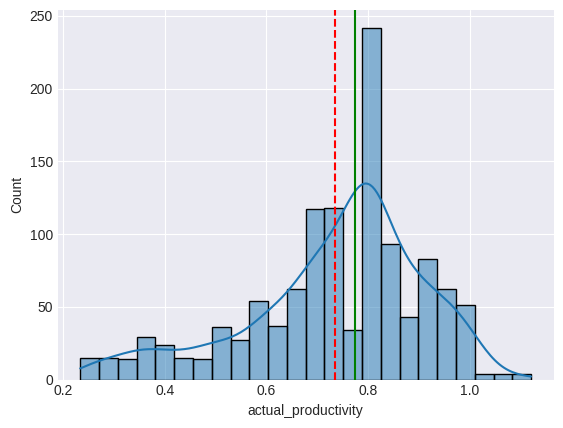

In [6]:
sb.histplot(data = datos, x = "actual_productivity", kde=True)
plt.axvline(x = datos.actual_productivity.mean(), color = "red", linestyle="dashed")
plt.axvline(x = datos.actual_productivity.median(), color="green")

In [7]:
#%conda install ipywidgets

In [8]:
profile = ProfileReport(datos)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Preparación De Datos
- completar nulos de wlp con 0
- Eliminar idle_time, idle_men y year
- Transformación de Categóricas y las numéricas con MinMaxScaler
- No transformar y

In [9]:
datos["wip"].fillna(0, inplace=True)
datos.drop(["idle_men", "idle_time", "year"], axis=1, inplace=True)

In [10]:
datos.head()

,quarter,department,day,team,targeted_productivity,smv,wip,over_time,incentive,no_of_style_change,no_of_workers,actual_productivity,num_day,month
0,Quarter1,sweing,Thursday,8,0.80,26.16,1108.0,7080,98,0,59.0,0.940725,1,1
1,Quarter1,finishing,Thursday,1,0.75,3.94,0.0,960,0,0,8.0,0.886500,1,1
2,Quarter1,sweing,Thursday,11,0.80,11.41,968.0,3660,50,0,30.5,0.800570,1,1
3,Quarter1,sweing,Thursday,12,0.80,11.41,968.0,3660,50,0,30.5,0.800570,1,1
4,Quarter1,sweing,Thursday,6,0.80,25.90,1170.0,1920,50,0,56.0,0.800382,1,1


In [11]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1197 entries, 0 to 1196
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   quarter                1197 non-null   object 
 1   department             1197 non-null   object 
 2   day                    1197 non-null   object 
 3   team                   1197 non-null   int64  
 4   targeted_productivity  1197 non-null   float64
 5   smv                    1197 non-null   float64
 6   wip                    1197 non-null   float64
 7   over_time              1197 non-null   int64  
 8   incentive              1197 non-null   int64  
 9   no_of_style_change     1197 non-null   int64  
 10  no_of_workers          1197 non-null   float64
 11  actual_productivity    1197 non-null   float64
 12  num_day                1197 non-null   int64  
 13  month                  1197 non-null   int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 131.1+ 

In [18]:
x = datos.drop("actual_productivity", axis=1)
y = datos["actual_productivity"]

In [21]:
num_cols = x.select_dtypes(include=["float64", "int64"]).columns.to_list()

cat_cols = x.select_dtypes(include=["object"]).columns.to_list()


num_transformer = Pipeline(steps=[("scaler", MinMaxScaler())])
cat_transformer = Pipeline(steps=[("onehot", OneHotEncoder(handle_unknown="ignore"))])

preprocesador = ColumnTransformer(transformers=[("num", num_transformer, num_cols),
                                                ("cat", cat_transformer, cat_cols)],
                                                remainder="passthrough")

set_config("diagram")
preprocesador

ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('scaler', MinMaxScaler())]),
                                 ['team', 'targeted_productivity', 'smv', 'wip',
                                  'over_time', 'incentive',
                                  'no_of_style_change', 'no_of_workers',
                                  'num_day', 'month']),
                                ('cat',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['quarter', 'department', 'day'])])

In [23]:
datos_pre = preprocesador.fit_transform(x)
cod_cat = preprocesador.named_transformers_["cat"]["onehot"].get_feature_names_out(cat_cols)
labels = np.concatenate([num_cols, cod_cat])
x_pro = pd.DataFrame(datos_pre, columns=labels)

x_pro

,team,targeted_productivity,smv,wip,over_time,incentive,no_of_style_change,no_of_workers,num_day,month,...,quarter_Quarter5,department_finishing,department_finishing,department_sweing,day_Monday,day_Saturday,day_Sunday,day_Thursday,day_Tuesday,day_Wednesday
0,0.636364,1.000000,0.450252,0.047920,0.273148,0.027222,0.0,0.655172,0.000000,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.000000,0.931507,0.020132,0.000000,0.037037,0.000000,0.0,0.068966,0.000000,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.909091,1.000000,0.164731,0.041865,0.141204,0.013889,0.0,0.327586,0.000000,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,1.000000,1.000000,0.164731,0.041865,0.141204,0.013889,0.0,0.327586,0.000000,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.454545,1.000000,0.445219,0.050601,0.074074,0.013889,0.0,0.620690,0.000000,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1192,0.818182,0.931507,0.000000,0.000000,0.037037,0.000000,0.0,0.068966,0.333333,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1193,0.636364,0.863014,0.019357,0.000000,0.037037,0.000000,0.0,0.068966,0.333333,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1194,0.545455,0.794521,0.019357,0.000000,0.037037,0.000000,0.0,0.068966,0.333333,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1195,0.727273,0.931507,0.000000,0.000000,0.069444,0.000000,0.0,0.149425,0.333333,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [24]:
#Separación en entrenamiento y prueba

x_train, x_test, y_train, y_test = train_test_split(x_pro, y, train_size=0.7, random_state=123)

## Modelado

In [25]:
modelo_1 = LinearRegression()
modelo_2 = SVR()
modelo_3 = KNeighborsRegressor()
modelo_4 = DecisionTreeRegressor()
modelo_5 = RandomForestRegressor()
modelo_6 = AdaBoostRegressor()
modelo_7 = GradientBoostingRegressor()
modelo_8 = MLPRegressor()

In [28]:
modelo_1.fit(x_train, y_train)

pred_1 = modelo_1.predict(x_test)

r2_1 = r2_score(y_test, pred_1)
rmse_1 = mean_squared_error(y_test, pred_1, squared=False)
mae_1 = mean_absolute_error(y_test, pred_1)
mape_1 = mean_absolute_percentage_error(y_test, pred_1)

print(f"""Las métricas de desempeño para la Regresión Lineal son: \n
            R2: {r2_1}\n
            RMSE: {rmse_1}\n
            MAE: {mae_1}\n
            MAPE: {mape_1}""")

Las métricas de desempeño para la Regresión Lineal son: 

            R2: 0.23878894172378962

            RMSE: 0.1539925245589524

            MAE: 0.1168682780890413

            MAPE: 0.20806284667126163
